## E-retail factors for customer activation and retention: A case study from Indian e-commerce customers

Customer satisfaction has emerged as one of the most important factors that guarantee the success of online store; it has been posited as a key stimulant of purchase, repurchase intentions and customer loyalty. A comprehensive review of the literature, theories and models have been carried out to propose the models for customer activation and customer retention. Five major factors that contributed to the success of an e-commerce store have been identified as: service quality, system quality, information quality, trust and net benefit. The research furthermore investigated the factors that influence the online customers repeat purchase intention. The combination of both utilitarian value and hedonistic values are needed to affect the repeat purchase intention (loyalty) positively. The data is collected from the Indian online shoppers. Results indicate the e-retail success factors, which are very much critical for customer satisfaction.


____

##### Install these libraries before you proceed

In [238]:
!pip install pandas-profiling -q
!pip install sweetviz -q
!pip install lime -q

# Importing the Libraries

In [129]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import train_test_split

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

# Import the Dataset

In [5]:
# Download the Excel file as it is

xls = pd.ExcelFile("D:\Customer_retention_dataset\Customer_retention_dataset.xlsx")

excel_sheet_1 = pd.read_excel(xls, 'datasheet')  # Excel sheet 1
excel_sheet_2 = pd.read_excel(xls, 'codedsheet') # Excel sheet 2 

# Write the dataframe object
# into csv file

excel_sheet_1.to_csv ("cust_ret_datasheet.csv", 
                  index = None,
                  header=True)

excel_sheet_2.to_csv ("cust_ret_codedsheet.csv", 
                  index = None,
                  header=True)
    
    
# read csv file and convert 
# into a dataframe object
df1 = pd.DataFrame(pd.read_csv("cust_ret_datasheet.csv"))
df2 = pd.DataFrame(pd.read_csv("cust_ret_codedsheet.csv"))


#### Stripping the extra spaces from the dataset

In [6]:
df1.columns = df1.columns.str.strip() # Actual data

df2.columns = df2.columns.str.strip() # Coded data

### We can see there are 269 records and 71 features and all these features are categorical in nature

In [7]:
df1.shape

(269, 71)

#### List of column names

In [8]:
df1.columns

Index(['1Gender of respondent', '2 How old are you?',
       '3 Which city do you shop online from?',
       '4 What is the Pin Code of where you shop online from?',
       '5 Since How Long You are Shopping Online ?',
       '6 How many times you have made an online purchase in the past 1 year?',
       '7 How do you access the internet while shopping on-line?',
       '8 Which device do you use to access the online shopping?',
       '9 What is the screen size of your mobile device?',
       '10 What is the operating system (OS) of your device?',
       '11 What browser do you run on your device to access the website?',
       '12 Which channel did you follow to arrive at your favorite online store for the first time?',
       '13 After first visit, how do you reach the online retail store?',
       '14 How much time do you explore the e- retail store before making a purchase decision?',
       '15 What is your preferred payment Option?',
       '16 How frequently do you abandon (sel

### Let's observe if we have any NaN values in the given dataset

#### We can see from the below that we do not have missing values and all values are accounted for

In [9]:
df1.isnull().sum()

1Gender of respondent                                                   0
2 How old are you?                                                      0
3 Which city do you shop online from?                                   0
4 What is the Pin Code of where you shop online from?                   0
5 Since How Long You are Shopping Online ?                              0
                                                                       ..
Longer delivery period                                                  0
Change in website/Application design                                    0
Frequent disruption when moving from one page to another                0
Website is as efficient as before                                       0
Which of the Indian online retailer would you recommend to a friend?    0
Length: 71, dtype: int64

#### We can observe the same result in plot format ( just for reference)

<AxesSubplot:>

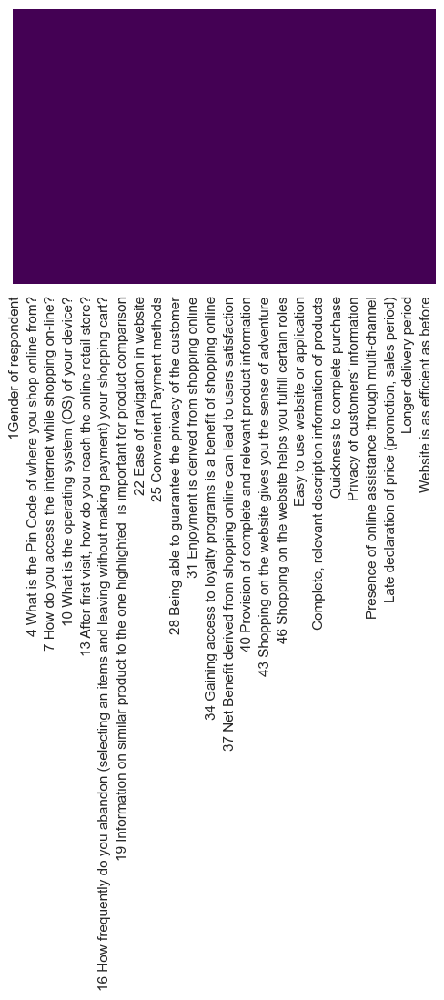

In [61]:
sns.heatmap(df1.isnull(), yticklabels=False, cbar=False, cmap="viridis")

### Using "Info" we got to know we have only 1 Int type feature and rest all 70 are categotical features

In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                                                                                                        Non-Null Count  Dtype 
---  ------                                                                                                        --------------  ----- 
 0   1Gender of respondent                                                                                         269 non-null    object
 1   2 How old are you?                                                                                            269 non-null    object
 2   3 Which city do you shop online from?                                                                         269 non-null    object
 3   4 What is the Pin Code of where you shop online from?                                                         269 non-null    int64 
 4   5 Since How Long You are Shopping Online ?                    

#### Displaying the same dataset from "sheet 2" for reference.

In [63]:
df2

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?,10 What is the operating system (OS) of your device?,...,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer would you recommend to a friend?
0,0,3,Delhi,110009,5,4,4,3,5,1,...,Amazon.in,Amazon.in,Flipkart.com,Flipkart.com,Amazon.in,Paytm.com,Flipkart.com,Amazon.in,Amazon.in,Flipkart.com
1,1,2,Delhi,110030,5,5,2,1,2,3,...,"Amazon.in, Flipkart.com",Myntra.com,snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Myntra.com,"Amazon.in, Flipkart.com","Amazon.in, Myntra.com"
2,1,2,Greater Noida,201308,4,5,3,1,4,2,...,Myntra.com,Myntra.com,Myntra.com,Myntra.com,Amazon.in,Paytm.com,Paytm.com,Paytm.com,Amazon.in,"Amazon.in, Paytm.com, Myntra.com"
3,0,2,Karnal,132001,4,1,3,1,4,3,...,Snapdeal.com,"Myntra.com, Snapdeal.com",Myntra.com,Paytm.com,Paytm.com,Paytm.com,"Amazon.in, Flipkart.com","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com"
4,1,2,Bangalore,530068,3,2,2,1,2,3,...,"Flipkart.com, Paytm.com",Paytm.com,Paytm.com,Paytm.com,Snapdeal.com,Paytm.com,Amazon.in,Snapdeal.com,Paytm.com,"Amazon.in, Myntra.com"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,1,2,Solan,173212,2,1,3,1,4,2,...,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in
265,1,3,Ghaziabad,201008,2,4,3,1,5,2,...,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com,Flipkart.com
266,1,4,Bangalore,560010,3,1,3,2,5,1,...,Amazon.in,Snapdeal.com,Amazon.in,Snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Amazon.in
267,1,1,Solan,173229,3,1,2,1,4,2,...,Amazon.in,"Amazon.in, Myntra.com, Snapdeal.com",Amazon.in,"Amazon.in, Snapdeal.com",Amazon.in,Amazon.in,Amazon.in,"Myntra.com, Snapdeal.com","Myntra.com, Snapdeal.com",Amazon.in


### Since the describe method works only on numerical  data (both on continous or converted data) I have used "df2" file of dataset

#### We can clearly see there is that mean is greater than std, which is correct. In some cases, we find the opposite scenario which could mean the data was incorrectly entered or some human error took palce.

#### Although this dataset doesn't consist all the neumerical values, I shall convert the remaining using encoding techniques.

In [62]:
df2.describe()

,1Gender of respondent,2 How old are you?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?,10 What is the operating system (OS) of your device?,11 What browser do you run on your device to access the website?,...,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,...,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000
mean,0.669145,2.959108,220465.747212,3.524164,2.672862,3.260223,1.676580,4.282528,1.776952,1.275093,...,4.182156,4.148699,4.349442,4.263941,3.914498,3.553903,3.223048,3.501859,3.282528,4.163569
std,0.471398,1.066012,140524.341051,1.436586,1.651788,1.135887,0.843904,0.923426,0.797892,0.645429,...,1.072162,0.842110,0.755953,1.000485,0.693879,1.065869,1.219581,1.141564,1.178995,0.648773
min,0.000000,1.000000,110008.000000,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,...,1.000000,2.000000,2.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,3.000000
25%,0.000000,2.000000,122018.000000,3.000000,1.000000,2.000000,1.000000,4.000000,1.000000,1.000000,...,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000
50%,1.000000,3.000000,201303.000000,4.000000,2.000000,3.000000,1.000000,4.000000,2.000000,1.000000,...,4.000000,4.000000,5.000000,5.000000,4.000000,4.000000,3.000000,3.000000,3.000000,4.000000
75%,1.000000,4.000000,201310.000000,5.000000,4.000000,5.000000,2.000000,5.000000,2.000000,1.000000,...,5.000000,5.000000,5.000000,5.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000
max,1.000000,5.000000,560037.000000,5.000000,5.000000,5.000000,4.000000,5.000000,3.000000,4.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


# Explore the dataset with Pandas Profiling

#### The following library helps in analyzing the dataset to give us some understanding on individual features

In [13]:
from pandas_profiling import ProfileReport

In [14]:
profile = ProfileReport(df1, title="Pandas Profiling Report", explorative=True)

In [15]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/84 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

### I have used SweetViz library for simple EDA for better understanding

                                             |          | [  0%]   00:00 -> (? left)


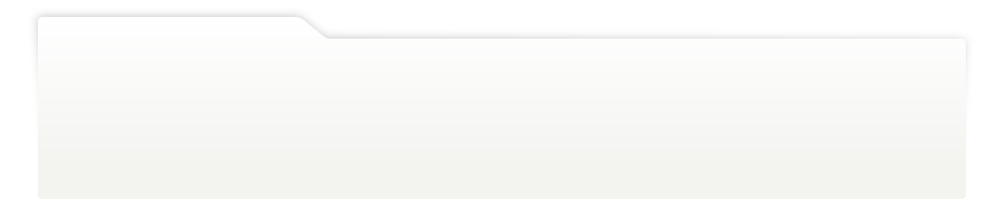
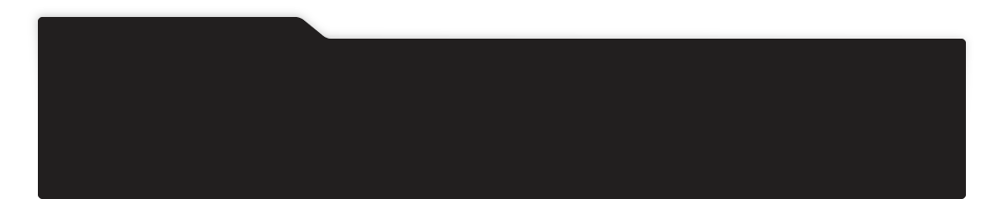
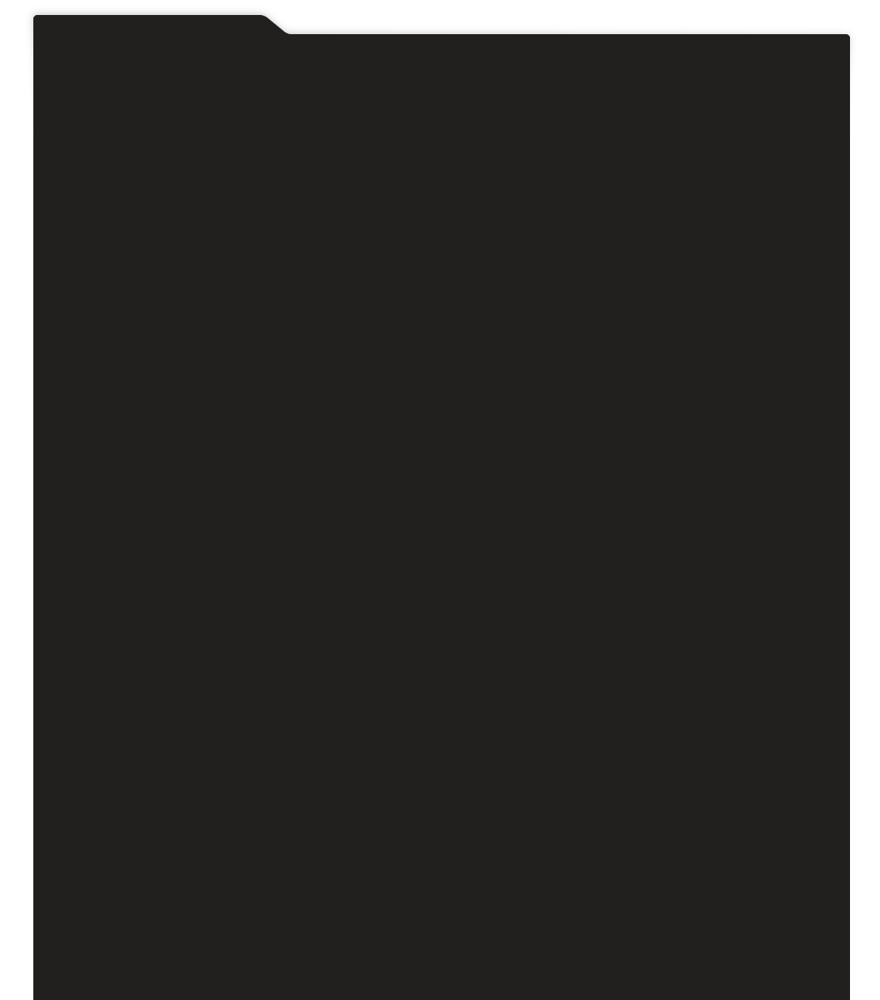
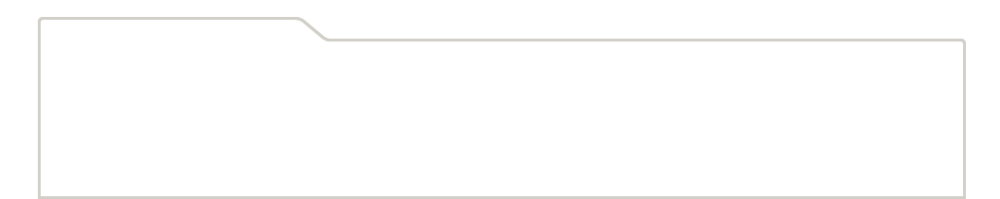
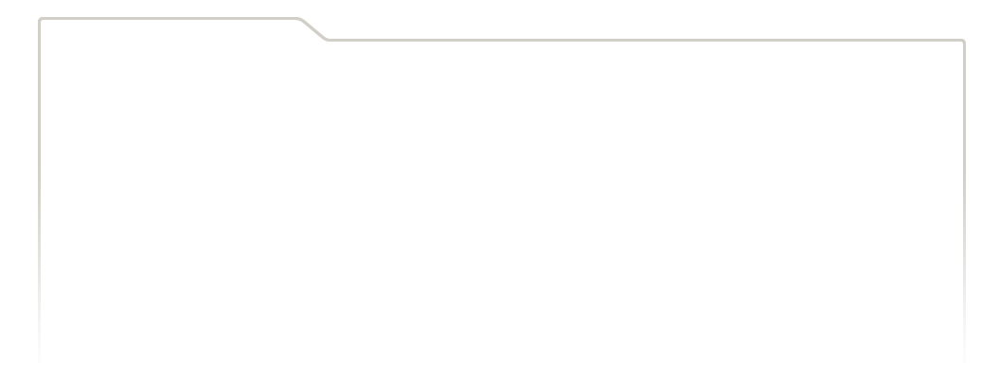
...
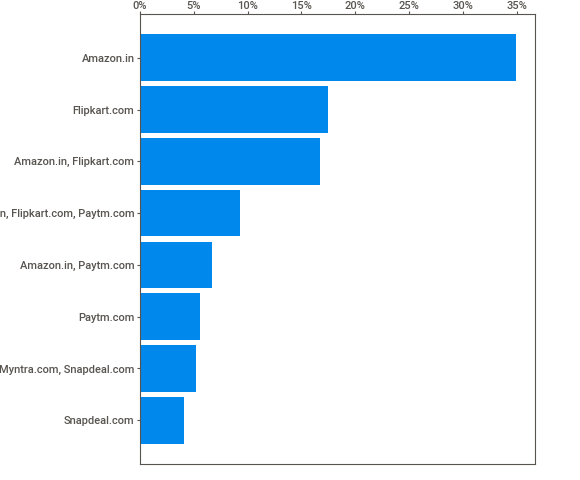
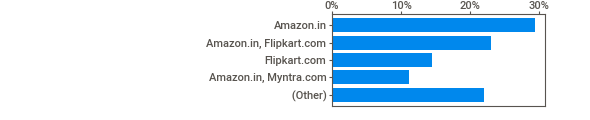
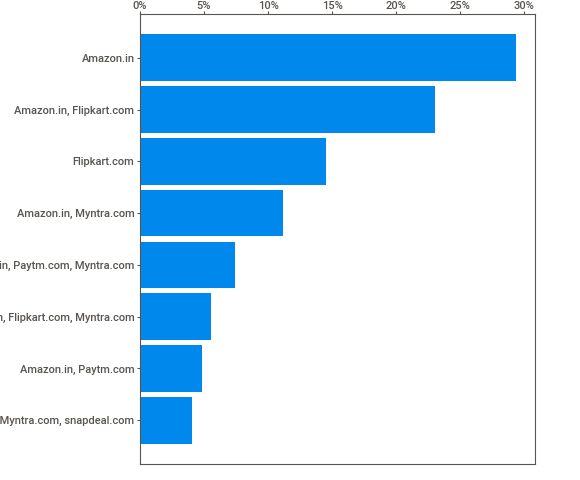
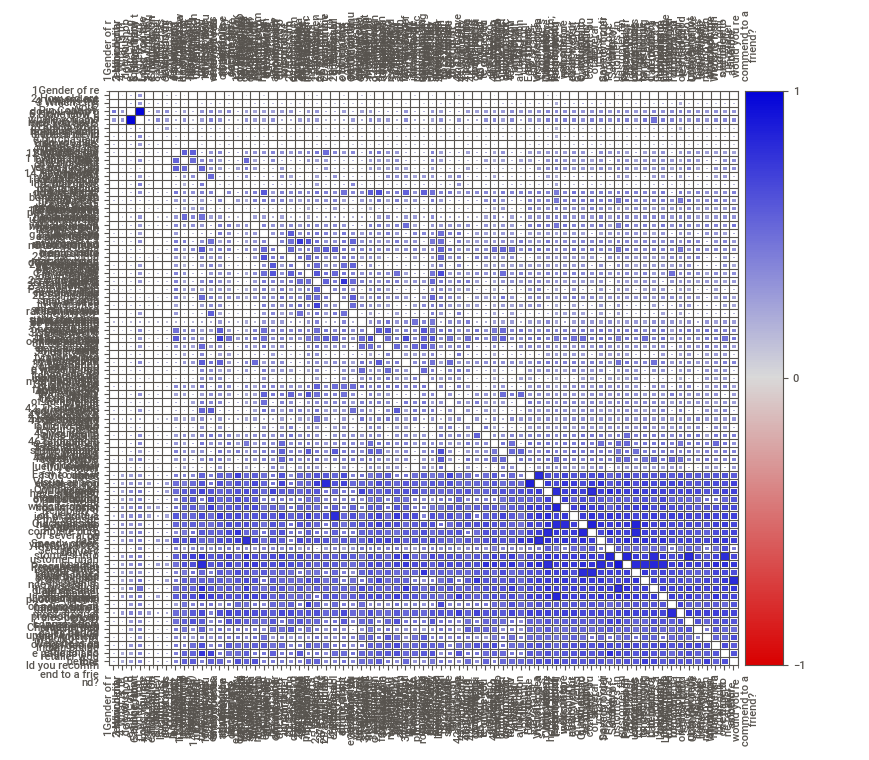
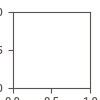

Report 'sweet_report.html' was saved to storage.


In [16]:
import sweetviz as sv
sweet_report = sv.analyze(df1)
sweet_report.show_notebook(filepath='sweet_report.html', layout='widescreen', w=900)

# Lets plot a couple of plots for further understanding

#### The follwing dataset appears to have approximately 67% of Female respondents and approximately 32 % of Male respondents.

#### But can we simply assume that Female purchase more online than Male? No we cannot. This dataset has only 269 records and it's merely difficult to conclude the majority in general. 

#### However we can assume that the data when this was recorded Female made more purchases than Male customers.

#### Below is the percentage count followed with a plot to give us an idea of how it looks like in general.

In [17]:
gender_percent = (df1["1Gender of respondent"].value_counts()/df1.shape[0])*100
print(gender_percent)

Female    67.286245
Male      32.713755
Name: 1Gender of respondent, dtype: float64


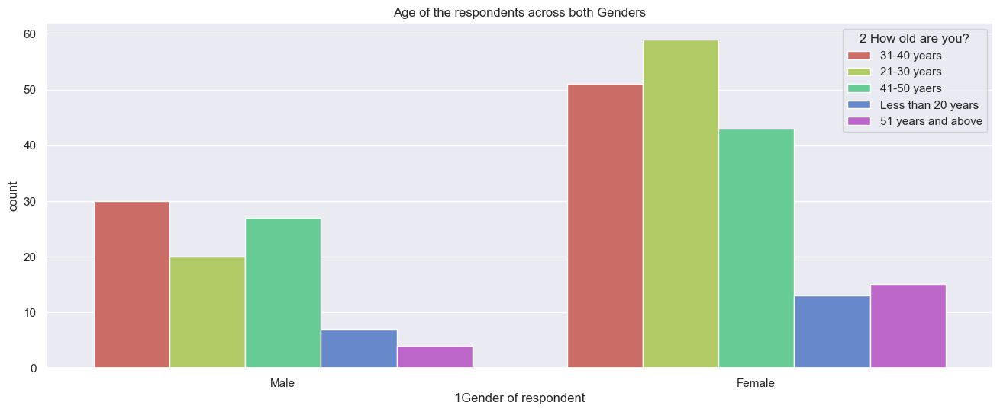

In [18]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="1Gender of respondent", data=df1, palette="hls", hue="2 How old are you?").set(title='Age of the respondents across both Genders')

#### Let's observe if there is any relationship between online purchases and the city

#### We can see that the repondents in this case appear to be majorly from "Delhi" as it has highest online purchases followed by"Greater Noida" "Noida" and "Bangalore" seem to have high traffic in online purchases

#### We can observe that these are metropolitan or semi metropolitan cities atleaset, known for multiple companies and IT sector in general. A lot of outsiders come here and population is also very high. 

#### This could in a way may have creted a pavement for more online purchases as opposed to going to Brick-and-Mortar stores

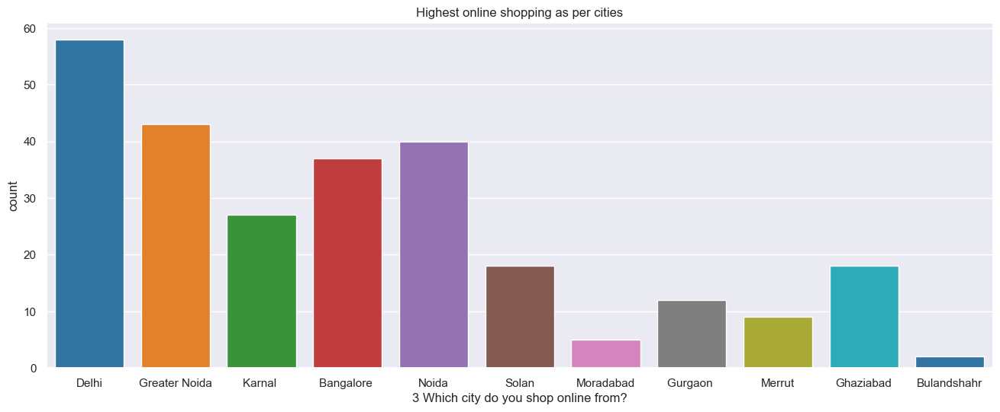

In [19]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="3 Which city do you shop online from?", data=df1, palette="tab10").set(title='Highest online shopping as per cities')


### For ease of reference, I have plotted a map of the location

#### I have extracted the "latitude" and "longitude" as many as possible using the "zipcodes" from the dataset

#### For this I have used Python's geopy library. Since all the zipcodes are in and around the limited cities, I have not extracted all the pincodes and only a handful of them

In [20]:
pincodes = df1["4 What is the Pin Code of where you shop online from?"].values.tolist()

In [21]:
geo_lat = []
geo_lon = []
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="my_user_agent")

for i in pincodes:
    try:
        location = geolocator.geocode(i)
        geo_lat.append((location.latitude))
        geo_lon.append((location.longitude))
    except:
        pass

In [22]:
# creating a list of "latitude" and "longitude"

geoloc = {
          "Latitude":geo_lat,
          "Longitude":geo_lon
        }

# creating a new dataframe for this list 

df_geoloc = pd.DataFrame(geoloc)

### I have used "Plotly" for displaying the map using "density_mapbox"

#### We can see the highlighted areas and majority of shopping have taken place in "North India" and in "South India" only Bangalore seems to be the city.

In [64]:
import plotly.express as px
import pandas as pd

fig = px.density_mapbox(df_geoloc, lat='Latitude', lon='Longitude', radius=20, opacity=0.5,
                        zoom=4, center=dict(lat=20.593683, lon=78.9629), height=710,
                        mapbox_style="stamen-terrain")
fig.show()

#### Let's see if we can find any relationship between number of purchases made from online sources

#### We can see in every case, majority of people have bought products less than 10 times atleast in 1 the last 1 year

#### As the the customer gives more number of years to online purchase, the quantity of purchase also increases

#### We can see that customer who have been purchasing online for more than 4 years and above have bought atleast 31- 40 times

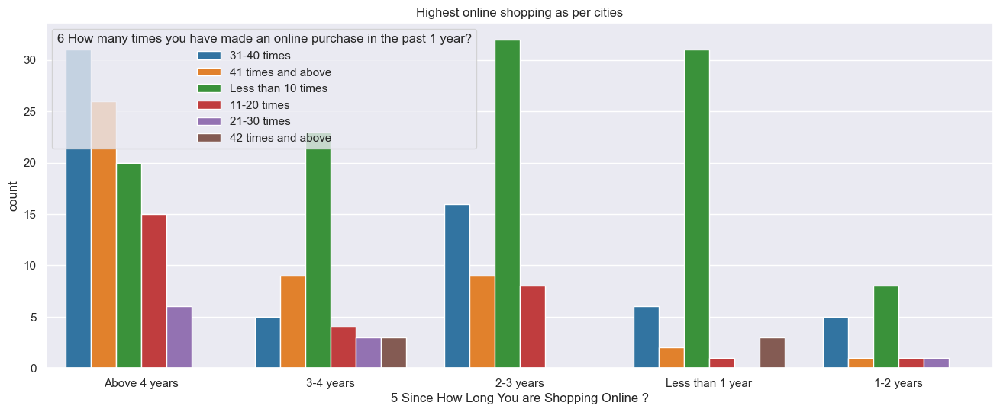

In [24]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="5 Since How Long You are Shopping Online ?", data=df1, hue="6 How many times you have made an online purchase in the past 1 year?", palette="tab10").set(title='Highest online shopping as per cities')

#### We can see from the below plot that majority of customers prefer and are of the opiion that shopping online is convinient and flexible.

#### At present, given the work conditions a person may not prefer going out. Going out for dhopping also means spening more time and spending money to commute etc.

#### It may not be a big deal, but imagine all you want is to buy a product that is relatively cheaper, or if products are manufacture or found in specific location, provinces etc. Travelling to that place for that product makes no sense. 

#### Also, the amount of time we may spend to investigate or compare physically can be reduced considerably by browing online

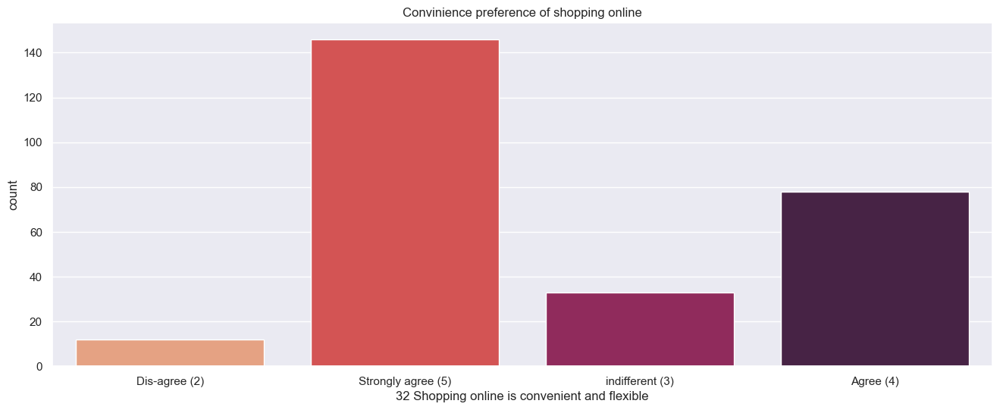

In [77]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="32 Shopping online is convenient and flexible", 
                   data=df1, palette="rocket_r").set(title='Convinience preference of shopping online')


#### From the previous graphs it was found that we have more Female customers and we can see very few customers have bought more than 42 times and above in a year among both the genders.

#### But the rate of purchase of items atleast "31- 40 times" or "less than 10 times" is more among "Women" than the total count of "Men"

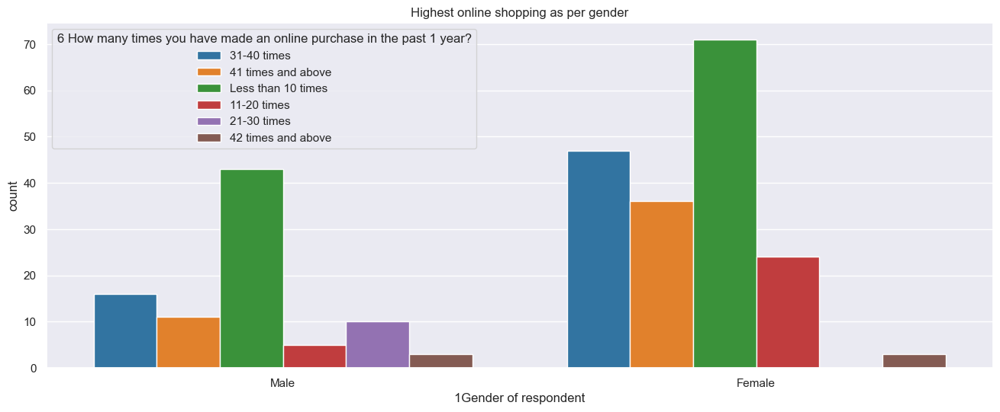

In [65]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="1Gender of respondent", data=df1, hue="6 How many times you have made an online purchase in the past 1 year?", palette="tab10").set(title='Highest online shopping as per gender')

#### Let's see what devices customers prefer using to make online purchases

#### If we observe the points carefully, we can see for "Laptop" and "Smartphone" its almost full and "Smartphone" has more complete point of line.

#### This indicates the customers prefer ordering / shopping online and prefer "Smartphones" followed by "Laptops". These are 2 devices that are very common to have with most of the people whether they are working class or not.

#### We also know that internet services and basic smartphones in India are relatively cheaper compared to most of the coutries including the already developed nations.

#### The indiect supply and demad seems to boost one's needs towards online shopping, not only becasue one wants to , but also because one can simply do it anywhere and from any device.

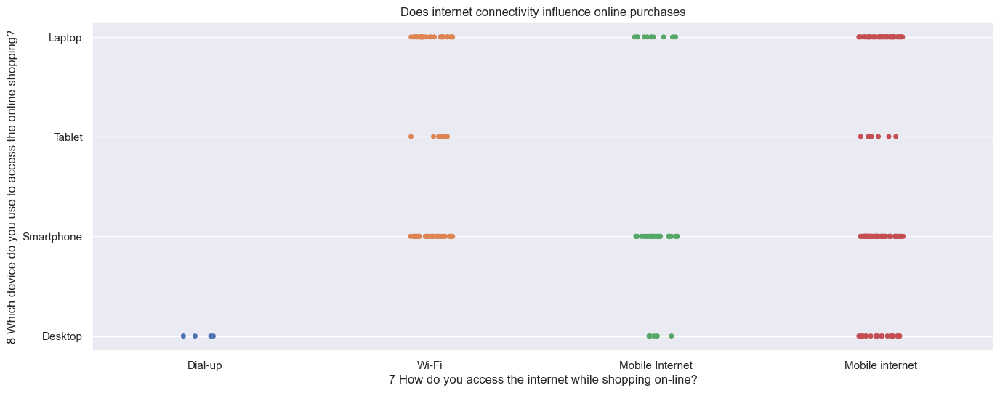

In [68]:
plt.figure(figsize=(16, 6))
g = sns.stripplot(x="7 How do you access the internet while shopping on-line?",y="8 Which device do you use to access the online shopping?", 
                  data=df1).set(title='Does internet connectivity influence online purchases')

#### Let's see if there is any relationship between channel and online store

#### We can see majority of people got to know about a specif store through search engines. These days it's quite common to search for an item online before buying products and the moment we do search, we get tonns of ads. 

#### The system understands our needs and in a way acts as a recommendation systems by targetting specific portions of that product by indirectly placing it in the search feeds.

#### If we consider the other categories "Content Marketing" and "Display Adverts", we can see the count if very less and these categories could also be influencing customers through online medium

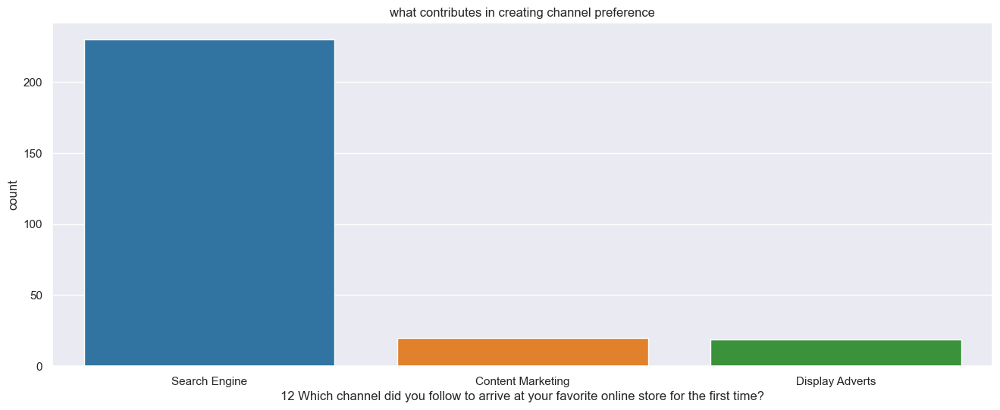

In [67]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="12 Which channel did you follow to arrive at your favorite online store for the first time?", 
                   data=df1, palette="tab10").set(title='what contributes in creating channel preference')


#### From the below plot we can understand that a person shopping online would prefer browsing through "Search Engine" as mentioned earlier, "Via application" or through "Direct URL"

#### We can see if a person purchases " within 1-5 mins" they may prefer going to specific online store directly. They know the services provided, they may have some kind of bias or inclination towards that E-comerce store and end up buying products impulsively or simply by trust.


#### But majority of spend more than 15 mins before they make any purchases online as they spend time on exploring the channel, or may compare prices etc.

#### We can also see that when it comes to "Search Engine" a perso may spend somewhere between " 6 - 10 mins". When we do not know what we are looking for and if we have a limited or irrelevant information, we tend to search through search engine like Google, Bing etc. which then directs us to relevant E-commerce stores

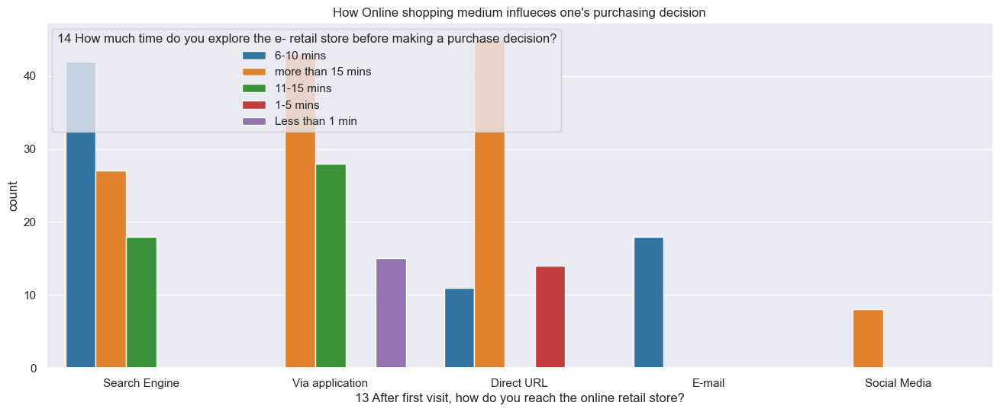

In [70]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="13 After first visit, how do you reach the online retail store?"
                   , data=df1, hue="14 How much time do you explore the e- retail store before making a purchase decision?", 
                   palette="tab10").set(title="How Online shopping medium influeces one's purchasing decision")


#### Let's observe if a person shopw online frequently or not

#### We can see that a persons likely to spend more time if they seldom bought anything online.  We can see from thebelow plot that a person may spend "more than 15 mins" if they have bought less than 10 products in a year.

#### As and when a person's purchases increase the time spent on looking or comparing is less. The customer is familiar with the brand, they may have already done a proper research before shopping online. 

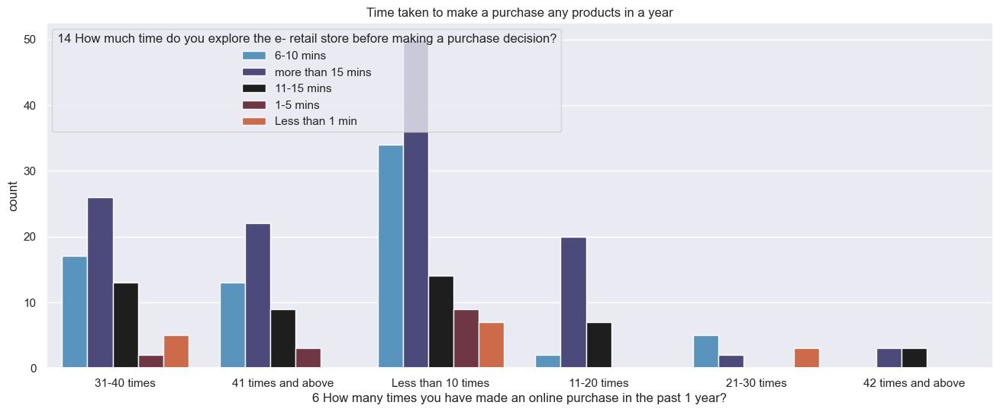

In [71]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="6 How many times you have made an online purchase in the past 1 year?"
                   , data=df1, hue="14 How much time do you explore the e- retail store before making a purchase decision?", 
                   palette="icefire").set(title='Time taken to make a purchase any products in a year')


#### Let's observe how often a person decides not to make a purchase right before making payment.

#### We can see that majority of customers don't do this and only "Sometimes" end up not shopping online. This could be due to decline in Credit/Devit cards, no availablility of EMI or availbility of EMI on specific Banks cards only etc.

#### We can also consider "Phonepe" or "GooglePay" as options as they are directly linked to Debit cards and although seem like E-Wallets they are much different. 

#### It's also a typical mindest amongst most Indians when shopping online they don't prefer online paymnet for expensive items. There could be scenarios where there is no cash on delivery or even chances where a person's online transaction is cancelled due to daily limit

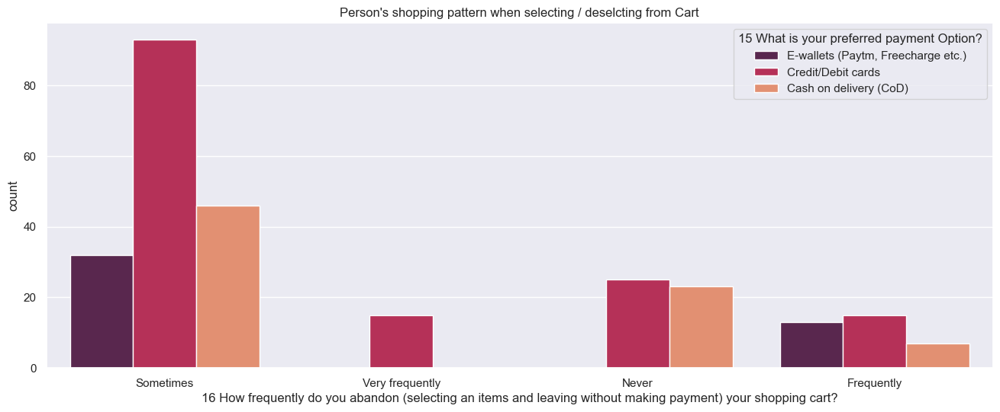

In [72]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?", 
                   data=df1, hue="15 What is your preferred payment Option?", palette="rocket").set(title="Person's shopping pattern when selecting / deselcting from Cart")


#### Let's see how a person responds to the usage of website.

#### We can see a person prefers a very good user interface that inturn helps in ease of navigation.

#### Today we have multiple E-Commerece channels but still we pick only handful of them for most of our shopping needs. 

#### A good looking webvsite with proper navigation that can include selection, comparison, etc till the payment mode will help in creating a good user interface.

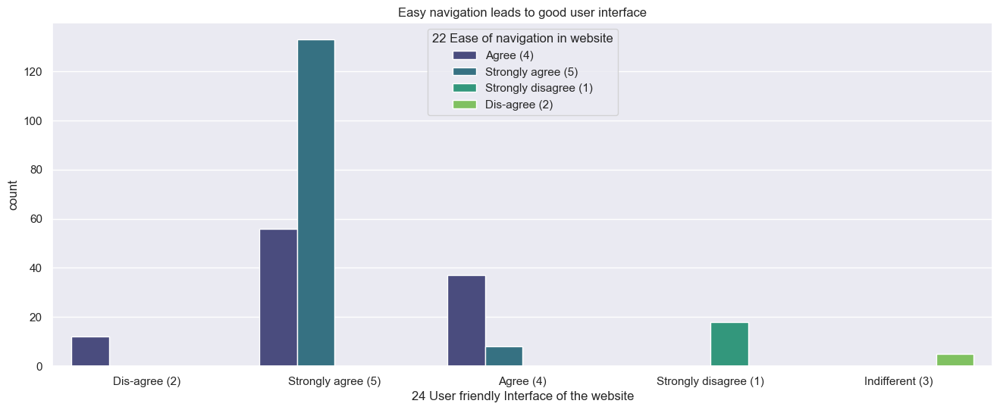

In [74]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="24 User friendly Interface of the website", 
                   data=df1, hue="22 Ease of navigation in website", palette="viridis").set(title='Easy navigation leads to good user interface')


#### We can see that if there is ease of navigation, there are good amount chances for a person ending up buying product.

#### This is an understatement and based on this alone we cannot determine the outcome of purchaing behaviour but it surely keeps you occupied for longer time to browse some more products.

#### If the user interface and navigation are good, we can even find similar products quite easily and this reduces the person's option of moving out of the cart by increasing the pool of products to select from.

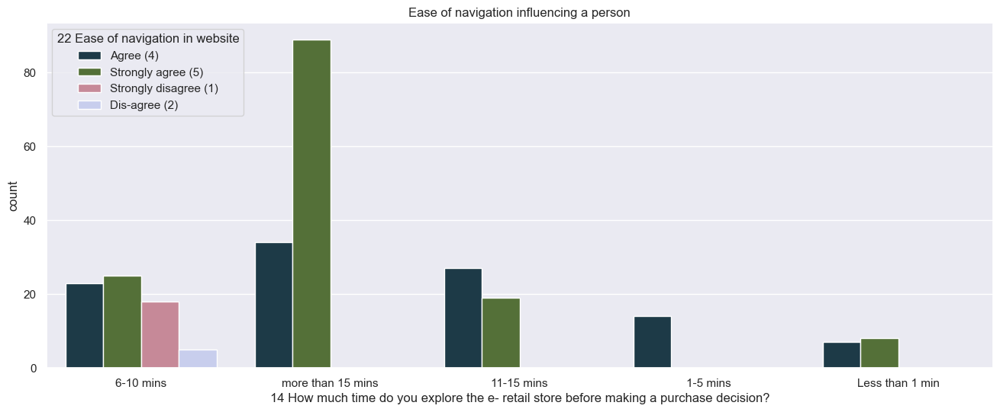

In [75]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="14 How much time do you explore the e- retail store before making a purchase decision?", 
                   data=df1, hue="22 Ease of navigation in website", palette="cubehelix").set(title='Ease of navigation influencing a person')


#### We can see from the below plot the preference of E-Commerce retailers the customer prefer in general

#### We can see that Amazon, Flipkart, Pytm, Myntra and Snapdeal are the most preferred online retailers. Cutsomers have bought itesms frm these retailers atleast once.

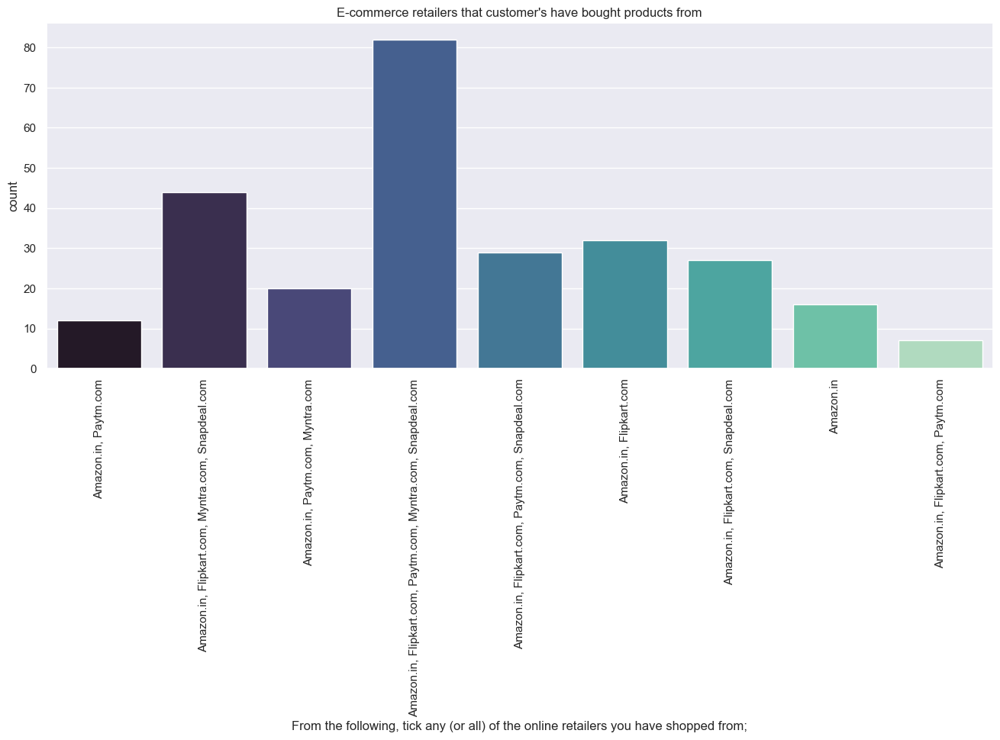

In [79]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="From the following, tick any (or all) of the online retailers you have shopped from;",data=df1, 
                   palette="mako").set(title="E-commerce retailers that customer's have bought products from")
plt.xticks(rotation=90)
plt.show()


#### We can observe from the below plot that majority of Indians prefer Amazon.in over other E-Commerce retailers.

#### We knowthat Flipkart is an Indian brand and still people prefer Amazon. We can say factors like good user interface, feasible price, good quality etc. comes into place even when selecting E-Commerce platform.

#### Good purchasing experince and work of mouth can play an important role. More than any means if advert work of mouth has more power and Amazon may have achieved that so far

#### Flipkart seems to be catching up with Amazon and other E-Commerce brands have an average recommendation

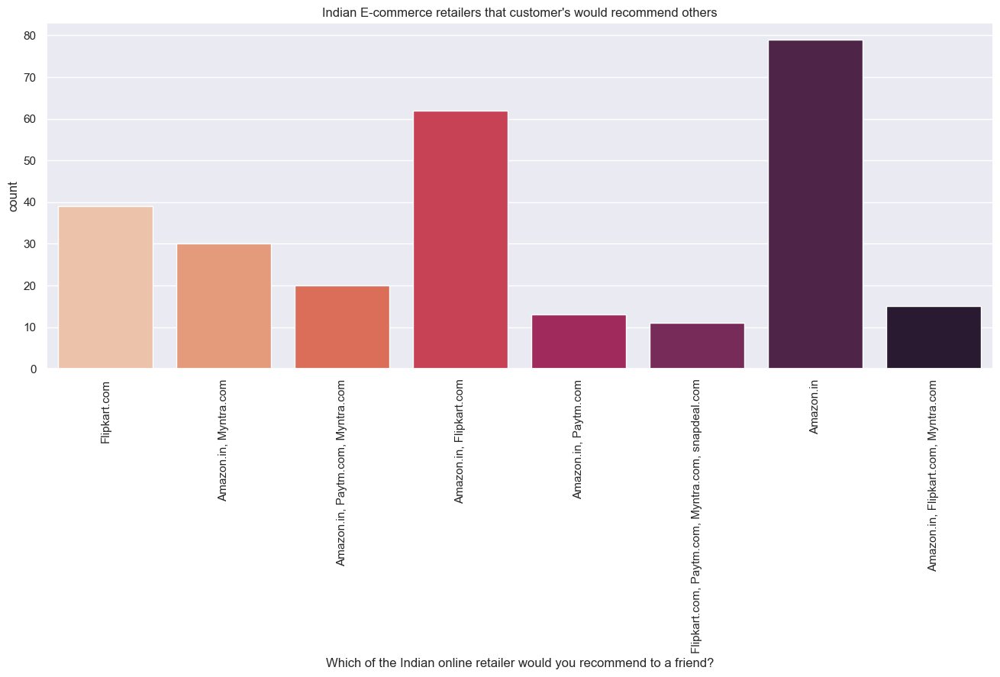

In [80]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Which of the Indian online retailer would you recommend to a friend?", 
                   data=df1, palette="rocket_r").set(title="Indian E-commerce retailers that customer's would recommend others")
plt.xticks(rotation=90)
plt.show()


#### From this plot, we can see how people agree on the importance of convinient payment method.

#### This also implies availabilit to have cash on delivery options which most of the Indians prefer when it comes to epensive purchases.

#### Having multiple and credible options of payments instills confidence in customers and could also lead to more purchases.

#### We can see that people "Strongly agree" in most of the cases

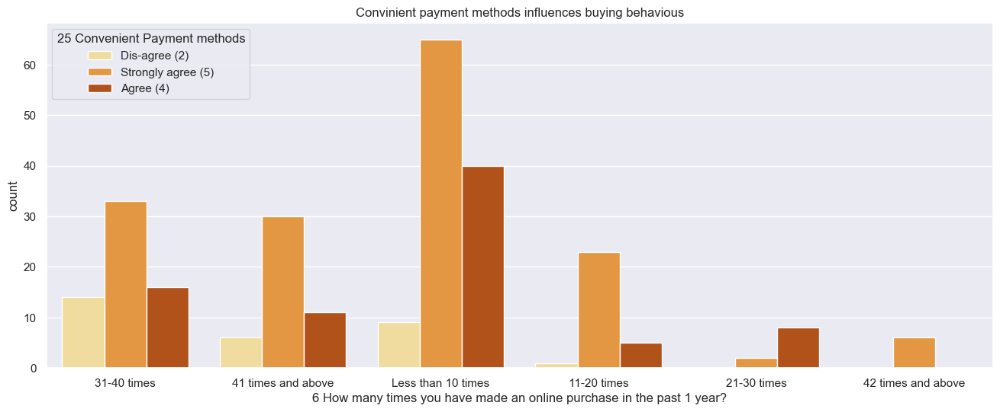

In [91]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="6 How many times you have made an online purchase in the past 1 year?", data=df1, palette="YlOrBr", 
                   hue="25 Convenient Payment methods").set(title='Convinient payment methods influences buying behavious')

plt.show()

#### This plot clearly states that trust is very much important if a person makes purchases online.

#### If we observe specifically, many of the E-Commerce retailers provide ratings of products, rating of retailers, possitive and negative feedbacks, reviews etc along with product for our ease of reference.

#### Each factor describes differently to individual customer. Eg: for someone having 4.5 or 5 start rating means it's good quality, for someone having long term warranty is important over other attributes.

#### Since E-Comerce gathers crowed with various mentality and thoughts, trust is very much imortant in building a value added relationship amongst each other 

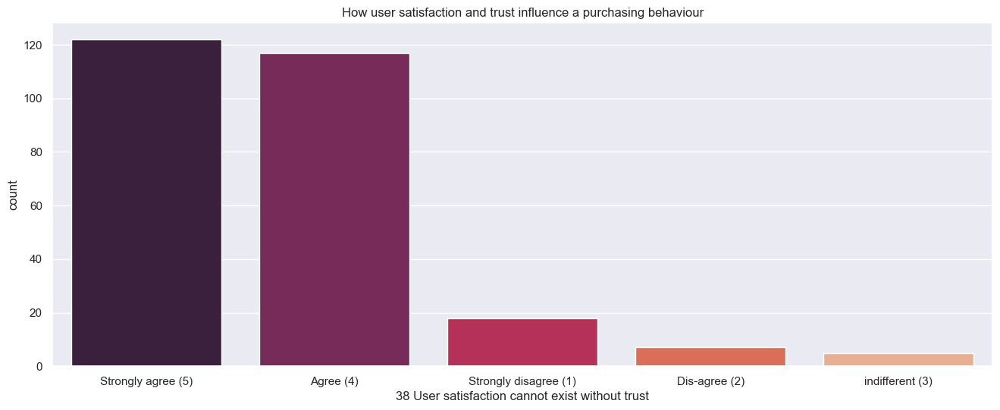

In [96]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="38 User satisfaction cannot exist without trust", 
                   data=df1, palette="rocket").set(title='How user satisfaction and trust influence a purchasing behaviour')


#### People seem to prefer websites that are highly reliable. This could include how fast it loads, how soon a graphic or certain feature is loaded, how flexible is the website that can be toggled on both Laptops and Smartphones.

#### This also explains the past user experience and noe matter how good it was, if there is a very bad experience, the customer is lost for good and may not prefer that channel next time. 


#### In this case we can see Amazon has good customer base follwed by Flipkart and are have more reliable and stable platform / website compared to others. In short, these are trusted openly copared to other E-Commerce brands.

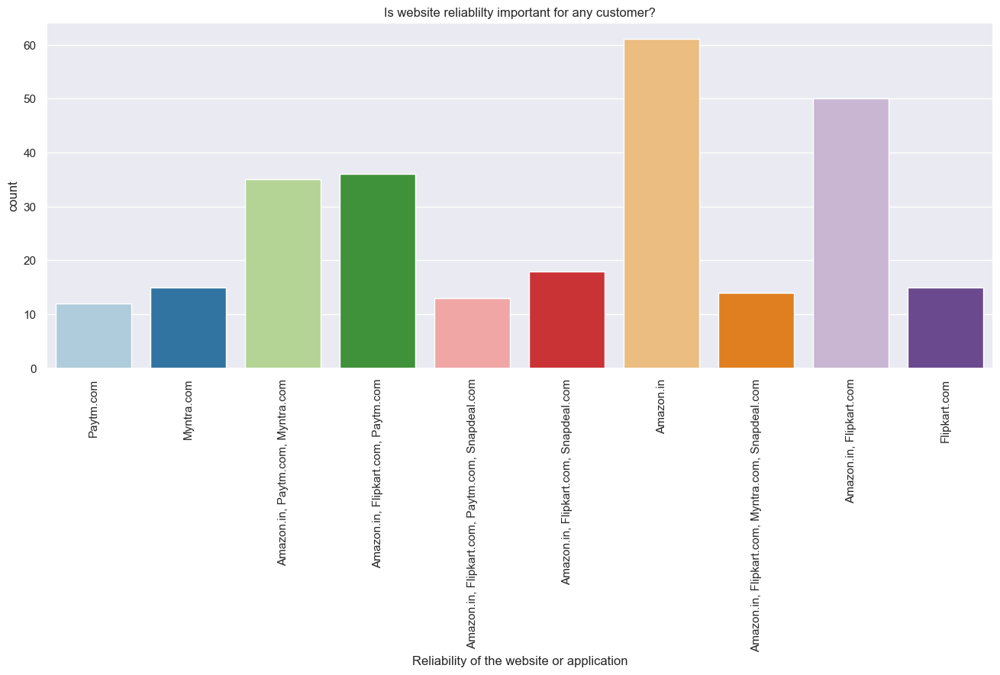

In [97]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Reliability of the website or application", 
                   data=df1, palette="Paired").set(title='Is website reliablilty important for any customer?')

plt.xticks(rotation=90)
plt.show()


#### People may also perfer purchasing online not just for discounts but also feel value for money to some extent.

#### Value for money is a satisfaction a person feel or adheres to when purchasing any product. No matter how imortant that product could be, if a person's financial budget doesn't fit or if they feel its not that worth in terms of monetary value that person is likely to drop the Cart.

#### By giving good discounts, providing EMI options and payment flexibility there is a good chance that that person could end up being a potential customer.

#### Value for money and monetary benefit could also be seen since delivery charges and packaging would be free, once can order from anywhere and get it delivered it anywhere which intern saves money that we end up spending if we go to a Brick and Mortar store

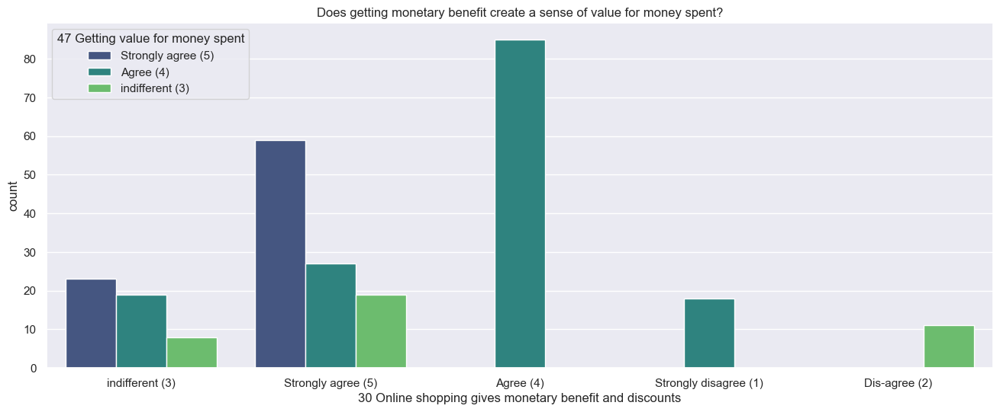

In [95]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="30 Online shopping gives monetary benefit and discounts", 
                   data=df1, palette="viridis", hue= "47 Getting value for money spent").set(title='Does getting monetary benefit create a sense of value for money spent?')

#### Offers, goodies, slight savings etc. highly influence a person's purchasing behaviour 

#### We can see that Amazon appears to have such perks more than other websites. We can see majority of people do abandon for either "Better alternative offer" or  if "Promo code isn't applicable" compared to other reasons.

#### This plot can also suggest us the discouts the product would offer, other additional items that can come along with the actal product  etc.

#### Such discounts are very common if you try purchasing electronic goods like Laptops, Smartphones or Smart TV's etc. as different retailer sell same or similar product and location frm where the product is manufacture or shipped from can increase or decrease price to some extent.

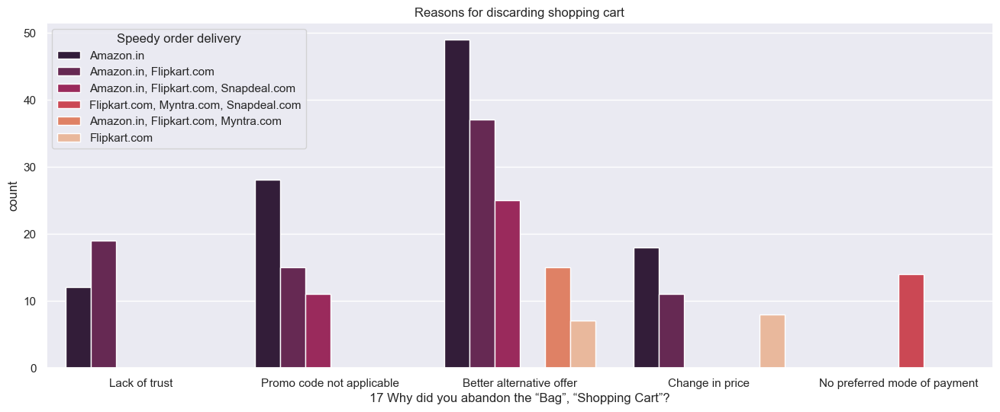

In [90]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="17 Why did you abandon the “Bag”, “Shopping Cart”?", 
                   data=df1, palette="rocket", hue= "Speedy order delivery").set(title='Reasons for discarding shopping cart')

#### The below plot show's how a website change or shutdown affects the smooth purchasing.

#### Majority of people have noticed such incidents happening on Amazon followed by Paytm and Myntra. if disruptions happen especially during payment, one may end up paying accidently and some issues may arise.

#### It is also not appealing to see constant changes as a person get's used to certain designs and is percoeved that such interfaces are user friendly. Rather than sudden changes, such changes could be done on certain ocasions to see the reaction or get feedback of customers and implement on a longer run if it's proven beneficial.

#### Since people use different devices that may or may not support certain browsers, changes made on website should be as efficient as possible so that anyone can access on any devices with less fluctuations as possible.

#### Also if changes are really required, it would be wise for customers to be informed in prior either through emails or popup ads that are common these days 

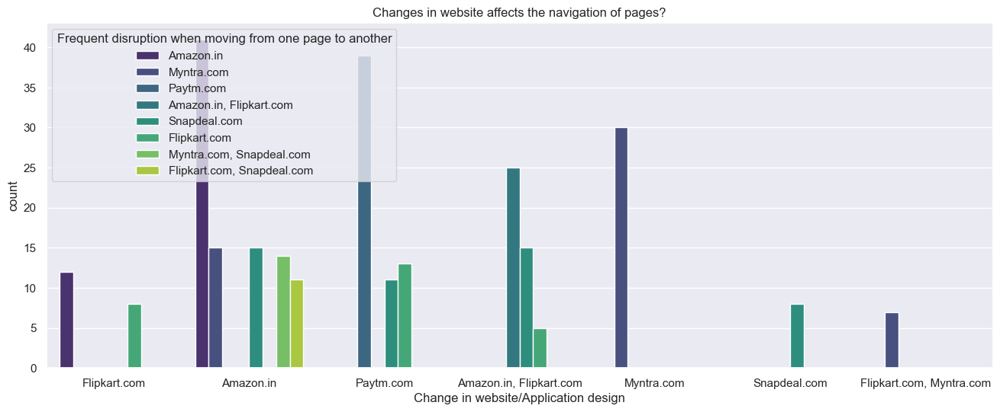

In [89]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(hue="Frequent disruption when moving from one page to another", 
                   data=df1, palette="viridis", x= "Change in website/Application design").set(title='Changes in website affects the navigation of pages?')

#### We can see that quality of information and detailed information is very much important.  The point of not going to stores physicall to examine the product, is an expectation that products displayed online have all the information

#### For some, color of the product is importamt, for some quality and durability, for some price is important etc and having detailed information increase the purchasing decision.

#### Users get a sense of purchaing satisfaction also because of good quaity of website

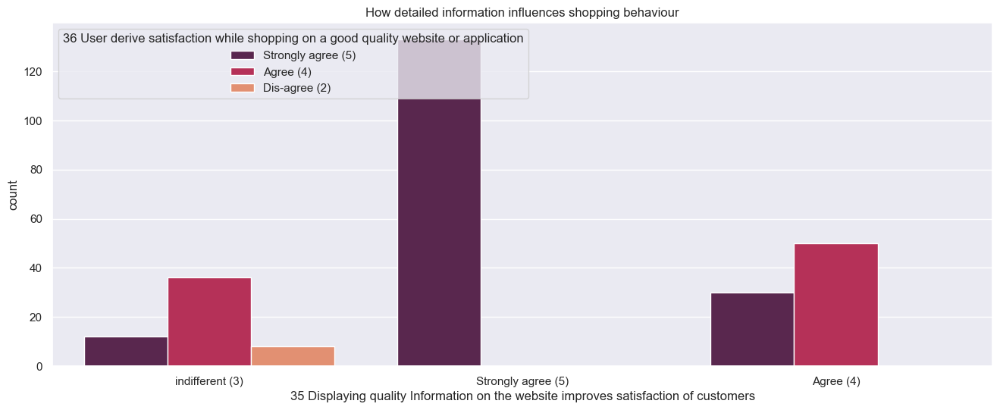

In [86]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="35 Displaying quality Information on the website improves satisfaction of customers", data=df1, 
                   palette="rocket", hue= "36 User derive satisfaction while shopping on a good quality website or application").set(title='How detailed information influences shopping behaviour')

#### We can see that return and return policy is highly infuencing a person's purchasing choice.

#### Amazon's seems to have good policies when it comes to this. Since we buy a product without knowing the attributes physically, there would be some sort of fear back in our minds psychologically whether the product we see is ame as it looks like.

#### Having return options can expand our horizon in getting better products as we know we can always exchange if the product doesn't meet our expectations.

#### This in turn increases the loyalty of customers

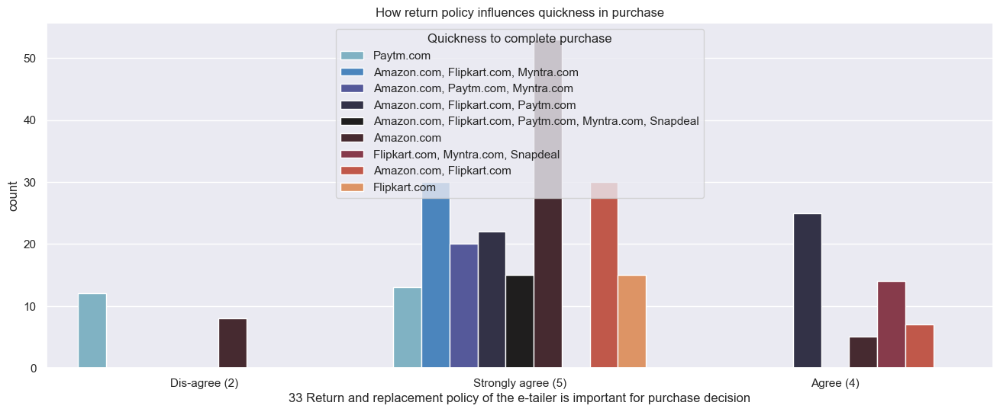

In [84]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="33 Return and replacement policy of the e-tailer is important for purchase decision", data=df1, 
                   palette="icefire", hue= "Quickness to complete purchase").set(title='How return policy influences quickness in purchase')

# Preprocessing

### Encoding the dataset
##### The numerical columns we can see below are already given to us. But if they were not provided, I would have applied OrdinarEncoding technique as all the values are in orderly manner.

##### For the remaining non converted categorical features, I shall use LabelEncoder as they are not required to be in order. 

In [100]:
df2.head()

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?,10 What is the operating system (OS) of your device?,...,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer would you recommend to a friend?
0,0,3,Delhi,110009,5,4,4,3,5,1,...,Amazon.in,Amazon.in,Flipkart.com,Flipkart.com,Amazon.in,Paytm.com,Flipkart.com,Amazon.in,Amazon.in,Flipkart.com
1,1,2,Delhi,110030,5,5,2,1,2,3,...,"Amazon.in, Flipkart.com",Myntra.com,snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Myntra.com,"Amazon.in, Flipkart.com","Amazon.in, Myntra.com"
2,1,2,Greater Noida,201308,4,5,3,1,4,2,...,Myntra.com,Myntra.com,Myntra.com,Myntra.com,Amazon.in,Paytm.com,Paytm.com,Paytm.com,Amazon.in,"Amazon.in, Paytm.com, Myntra.com"
3,0,2,Karnal,132001,4,1,3,1,4,3,...,Snapdeal.com,"Myntra.com, Snapdeal.com",Myntra.com,Paytm.com,Paytm.com,Paytm.com,"Amazon.in, Flipkart.com","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com"
4,1,2,Bangalore,530068,3,2,2,1,2,3,...,"Flipkart.com, Paytm.com",Paytm.com,Paytm.com,Paytm.com,Snapdeal.com,Paytm.com,Amazon.in,Snapdeal.com,Paytm.com,"Amazon.in, Myntra.com"


### List of all the categorical columns have been passed to LabelEncoder as shown below

In [101]:
from sklearn.preprocessing import LabelEncoder

lab_enc = LabelEncoder()

In [113]:
df_new1 = lab_enc.fit_transform(df2["3 Which city do you shop online from?"])
df_new2 = lab_enc.fit_transform(df2["From the following, tick any (or all) of the online retailers you have shopped from;"])
df_new3 = lab_enc.fit_transform(df2["Easy to use website or application"])
df_new4 = lab_enc.fit_transform(df2["Visual appealing web-page layout"])
df_new5 = lab_enc.fit_transform(df2["Wild variety of product on offer"])
df_new6 = lab_enc.fit_transform(df2["Fast loading website speed of website and application"])
df_new7 = lab_enc.fit_transform(df2["Reliability of the website or application"])
df_new8 = lab_enc.fit_transform(df2["Quickness to complete purchase"])
df_new9 = lab_enc.fit_transform(df2["Availability of several payment options"])
df_new10 = lab_enc.fit_transform(df2["Speedy order delivery"])
df_new11 = lab_enc.fit_transform(df2["Privacy of customers’ information"])
df_new12 = lab_enc.fit_transform(df2["Security of customer financial information"])
df_new13 = lab_enc.fit_transform(df2["Perceived Trustworthiness"])
df_new14 = lab_enc.fit_transform(df2["Presence of online assistance through multi-channel"])
df_new15 = lab_enc.fit_transform(df2["Longer time to get logged in (promotion, sales period)"])
df_new16 = lab_enc.fit_transform(df2["Longer time in displaying graphics and photos (promotion, sales period)"])
df_new17 = lab_enc.fit_transform(df2["Late declaration of price (promotion, sales period)"])
df_new18 = lab_enc.fit_transform(df2["Longer page loading time (promotion, sales period)"])
df_new19 = lab_enc.fit_transform(df2["Limited mode of payment on most products (promotion, sales period)"])
df_new20 = lab_enc.fit_transform(df2["Longer delivery period"])
df_new21 = lab_enc.fit_transform(df2["Change in website/Application design"])
df_new22 = lab_enc.fit_transform(df2["Frequent disruption when moving from one page to another"])
df_new23 = lab_enc.fit_transform(df2["Website is as efficient as before"])
df_new24 = lab_enc.fit_transform(df2["Which of the Indian online retailer would you recommend to a friend?"])
df_new25 = lab_enc.fit_transform(df2["Complete, relevant description information of products"])


In [114]:
df2["3 Which city do you shop online from?"] = df_new1
df2["From the following, tick any (or all) of the online retailers you have shopped from;"] = df_new2
df2["Easy to use website or application"] = df_new3
df2["Visual appealing web-page layout"] = df_new4
df2["Wild variety of product on offer"] = df_new5
df2["Fast loading website speed of website and application"] = df_new6
df2["Reliability of the website or application"] = df_new7
df2["Quickness to complete purchase"] = df_new8
df2["Availability of several payment options"] = df_new9
df2["Speedy order delivery"] = df_new10
df2["Privacy of customers’ information"] = df_new11
df2["Security of customer financial information"] = df_new12
df2["Perceived Trustworthiness"] = df_new13
df2["Presence of online assistance through multi-channel"] = df_new14
df2["Longer time to get logged in (promotion, sales period)"] = df_new15
df2["Longer time in displaying graphics and photos (promotion, sales period)"] = df_new16
df2["Late declaration of price (promotion, sales period)"] = df_new17
df2["Longer page loading time (promotion, sales period)"] = df_new18
df2["Limited mode of payment on most products (promotion, sales period)"] = df_new19
df2["Longer delivery period"] = df_new20
df2["Change in website/Application design"] = df_new21
df2["Frequent disruption when moving from one page to another"] = df_new22
df2["Website is as efficient as before"] = df_new23
df2["Which of the Indian online retailer would you recommend to a friend?"] = df_new24
df2["Complete, relevant description information of products"] = df_new25


### We can see now the entire dataset is converted to numerical values

In [115]:
df2.head(2)

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?,10 What is the operating system (OS) of your device?,...,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer would you recommend to a friend?
0,0,3,2,110009,5,4,4,3,5,1,...,0,0,3,5,0,3,2,0,0,6
1,1,2,2,110030,5,5,2,1,2,3,...,1,6,7,10,7,5,0,4,1,3


# Distribution of all the columns in the dataset


### Since all the columns are actually categorical in nature, there is no need to deduce any understanding from distribution as it doesn't apply.

### Although we have pincodes as Int, these are also not the typical continous variables and hence distribution is not considered for this as well.

### This is how I would check the distribition and then proceed to remove outliers uisng either IQR or Z-score method to reduces skewness if the dataset was continous features

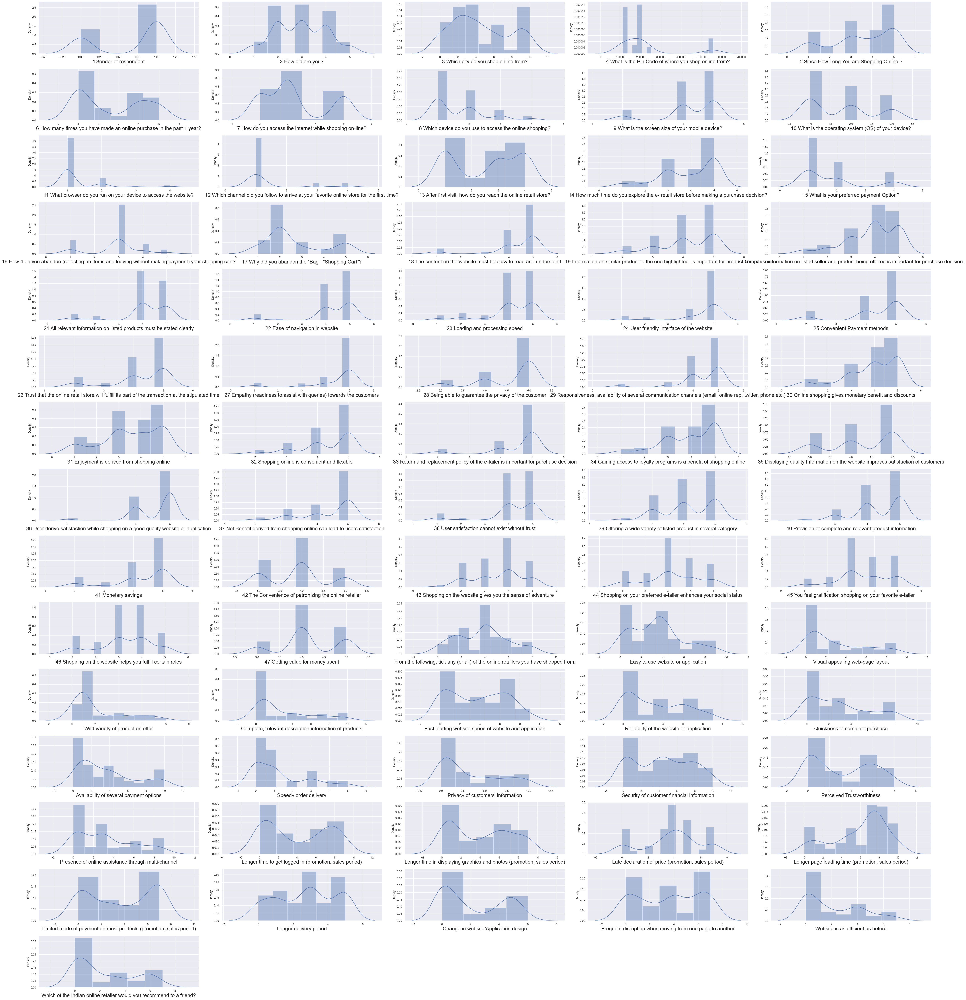

In [116]:
# let us now see the distribution of the dataset we have

plt.figure(figsize=(50,55), facecolor="white")
plotnumber = 1

for column in df2:
    if plotnumber <=71:
        ax = plt.subplot(15,5, plotnumber)
        sns.distplot(df2[column])
        plt.xlabel(column, fontsize=20)
    plotnumber+=1
plt.tight_layout()

# Splitting up of dataset between x (features) and y (target column)

In [120]:
x = df2.drop(columns = ["Which of the Indian online retailer would you recommend to a friend?"], axis=1)
y = df2["Which of the Indian online retailer would you recommend to a friend?"]

# Lets us now Scale the data for further processing.¶

#### we have used StandardScaler for further scaling up of data 


#### I have not used Variation Inflation Factor and haven't checked for skewness

In [121]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_scaled

array([[-1.42213639,  0.03843148, -0.78397694, ..., -0.08825722,
        -1.40519246, -0.98469733],
       [ 0.70316744, -0.9013929 , -0.78397694, ..., -1.0192844 ,
         0.16163354, -0.52322768],
       [ 0.70316744, -0.9013929 , -0.15539334, ...,  1.30828355,
         0.94504654, -0.98469733],
       ...,
       [ 0.70316744,  0.97825586, -1.41256055, ...,  1.77379714,
         1.33675303, -0.98469733],
       [ 0.70316744, -1.84121727,  1.73035746, ..., -1.0192844 ,
         0.55334004,  1.32265095],
       [ 0.70316744,  0.97825586, -0.46968514, ..., -1.0192844 ,
        -1.40519246, -0.98469733]])

# Check if the dataset is over sampling or under sampling

In [124]:
df2["Which of the Indian online retailer would you recommend to a friend?"].value_counts()

0    79
1    62
6    39
3    30
5    20
2    15
4    13
7    11
Name: Which of the Indian online retailer would you recommend to a friend?, dtype: int64

# I will proceed with SMOTE technique for Over Sampling of dataset
### Although very few amount of values are imbalanced, I would still consider it to be imbalanced dataset because, the accuracy of the model after balancing the dataset was much better than the unbalanced dataset.

In [125]:
#Handling class imbalance problem ny oversampling the moinority class

from imblearn.over_sampling import SMOTE
SM = SMOTE()
x_over, y_over = SM.fit_resample(x,y)

## Balanced dataset after SMOTE

In [126]:
y_over.value_counts()

0    79
1    79
2    79
3    79
4    79
5    79
6    79
7    79
Name: Which of the Indian online retailer would you recommend to a friend?, dtype: int64

# split the dataset into train and test data set

#### I have chosed 200 random state and 30% of data is divided in text dataset

In [127]:
x_train, x_test, y_train, y_test = train_test_split(x_over, y_over, test_size=0.30, random_state = 200)

<IPython.core.display.Javascript object>

# Create multi output classification models
#### I have considered 4 ML models in this scenario

### 1) DecisionTreeClassifier 

In [157]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)

y_pred = dt.predict(x_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

1.0
[[28  0  0  0  0  0  0  0]
 [ 0 24  0  0  0  0  0  0]
 [ 0  0 23  0  0  0  0  0]
 [ 0  0  0 19  0  0  0  0]
 [ 0  0  0  0 24  0  0  0]
 [ 0  0  0  0  0 23  0  0]
 [ 0  0  0  0  0  0 28  0]
 [ 0  0  0  0  0  0  0 21]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        24
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        19
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        21

    accuracy                           1.00       190
   macro avg       1.00      1.00      1.00       190
weighted avg       1.00      1.00      1.00       190



### 2) XGBClassifier

In [171]:
from xgboost import XGBClassifier
xgb_reg = XGBClassifier(eval_metric='mlogloss')
xgb_reg.fit(x_train,y_train)

y_pred = xgb_reg.predict(x_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

1.0
[[28  0  0  0  0  0  0  0]
 [ 0 24  0  0  0  0  0  0]
 [ 0  0 23  0  0  0  0  0]
 [ 0  0  0 19  0  0  0  0]
 [ 0  0  0  0 24  0  0  0]
 [ 0  0  0  0  0 23  0  0]
 [ 0  0  0  0  0  0 28  0]
 [ 0  0  0  0  0  0  0 21]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        24
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        19
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        21

    accuracy                           1.00       190
   macro avg       1.00      1.00      1.00       190
weighted avg       1.00      1.00      1.00       190



### 3) HistGradientBoostingClassifier

In [143]:
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier

hist_reg = HistGradientBoostingClassifier()
hist_reg.fit(x_train,y_train)

y_pred = hist_reg.predict(x_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

1.0
[[28  0  0  0  0  0  0  0]
 [ 0 24  0  0  0  0  0  0]
 [ 0  0 23  0  0  0  0  0]
 [ 0  0  0 19  0  0  0  0]
 [ 0  0  0  0 24  0  0  0]
 [ 0  0  0  0  0 23  0  0]
 [ 0  0  0  0  0  0 28  0]
 [ 0  0  0  0  0  0  0 21]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        24
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        19
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        21

    accuracy                           1.00       190
   macro avg       1.00      1.00      1.00       190
weighted avg       1.00      1.00      1.00       190



### 4) ExtraTreeClassifier

In [149]:
from sklearn.tree import ExtraTreeClassifier

ext_reg = ExtraTreeClassifier()
ext_reg.fit(x_train,y_train)

y_pred = ext_reg.predict(x_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

1.0
[[28  0  0  0  0  0  0  0]
 [ 0 24  0  0  0  0  0  0]
 [ 0  0 23  0  0  0  0  0]
 [ 0  0  0 19  0  0  0  0]
 [ 0  0  0  0 24  0  0  0]
 [ 0  0  0  0  0 23  0  0]
 [ 0  0  0  0  0  0 28  0]
 [ 0  0  0  0  0  0  0 21]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        24
           2       1.00      1.00      1.00        23
           3       1.00      1.00      1.00        19
           4       1.00      1.00      1.00        24
           5       1.00      1.00      1.00        23
           6       1.00      1.00      1.00        28
           7       1.00      1.00      1.00        21

    accuracy                           1.00       190
   macro avg       1.00      1.00      1.00       190
weighted avg       1.00      1.00      1.00       190



# Cross validation to check if its overfitting

In [135]:
from sklearn.model_selection import cross_val_score

In [166]:
scr = cross_val_score(dt, x, y, cv=5)
print("Cross Validation score of DecisionTreeClasifier model is:", scr.mean())

Cross Validation score of DecisionTreeClasifier model is: 0.9962962962962962


In [172]:
scr = cross_val_score(xgb_reg, x, y, cv=5)
print("Cross Validation score of XGBClassifier model is:", scr.mean())

Cross Validation score of XGBClassifier model is: 0.9888888888888889


In [144]:
scr = cross_val_score(hist_reg, x, y, cv=5)
print("Cross Validation score of HistGradientBoostingClassifier model is:", scr.mean())

Cross Validation score of HistGradientBoostingClassifier model is: 0.9962962962962962


In [152]:
scr = cross_val_score(ext_reg, x, y, cv=5)
print("Cross Validation score of ExtraTreeClassifier model is:", scr.mean())

Cross Validation score of ExtraTreeClassifier model is: 0.9962962962962962


# Selecting the best ML model for this dataset

### From the above algorithms HistGradientBoostingClassifier, ExtraTreeClassifier and DecisionTreeClasifier have lowest difference between the accuracy score and cross validation score and are all same.

### XGBClassifier has difference value more than other algorothms hence will not consider this

### I have used HistGradientBoostingClassifier in this scenario.

### Also I could not consider LogisticRegression as we have more than 2 classes in target columns


| Sr.No. | Models used | Model Accuracy | Cross Validation | Difference output |
| --- | --- | --- | --- |---|
| 1 | DecisionTreeClassifier | 100 | 0.996296296296296 | 99.0037037037037 |
| 2 | XGBClassifier | 100 | 0.988888888888888 | 99.0111111111111 |
| 3 | HistGradientBoostingClassifier | 100 | 0.996296296296296 | 99.0037037037037 |
| 4 | ExtraTreeClassifier | 100 | 0.996296296296296 | 99.0037037037037 |



# Hyper Parameter Tuning

### Let us try to tune the proposed model (HistGradientBoostingClassifier) to get better accuracy, if possible

##### The "paramaters" have been selected from the skicit library and I have considered 4 paramaters

In [187]:
parameters = {"loss":["auto", "binary_crossentropy", "categorical_crossentropy"],
              "random_state":[50, 70, 100, 130],
              "tol":[1e-1, 1e-5, 1e-7],
              "max_iter":[50, 70, 100, 130]
              }

### GridSearchCV is used to tune the parameters by fitting the same to the training dataset

In [189]:
from sklearn.model_selection import GridSearchCV
GCV = GridSearchCV(HistGradientBoostingClassifier(), parameters, cv=5)

In [190]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=HistGradientBoostingClassifier(),
             param_grid={'loss': ['auto', 'binary_crossentropy',
                                  'categorical_crossentropy'],
                         'max_iter': [50, 70, 100, 130],
                         'random_state': [50, 70, 100, 130],
                         'tol': [0.1, 1e-05, 1e-07]})

In [191]:
GCV.best_params_

{'loss': 'auto', 'max_iter': 50, 'random_state': 50, 'tol': 0.1}

### Rebuild the model using the appropriate params we recieved from best_params_


#### Its observed that the model accuracy is 100% for this dataset even after Hyperparameter tuningm and has not reduced.

In [192]:
mod_hist_class = HistGradientBoostingClassifier(loss= "auto", max_iter= 50, random_state= 50, tol =0.1)

mod_hist_class.fit(x_train,y_train)
pred = mod_hist_class.predict(x_test)
print(accuracy_score(y_test,pred)*100)

100.0


# Saving the model (using joblib)

In [193]:
# Saving the model

import joblib
joblib.dump(mod_hist_class,"Cust_Ret_Prediction.pkl")

['Cust_Ret_Prediction.pkl']

# Loading the saved model

In [194]:
model = joblib.load("Cust_Ret_Prediction.pkl")

In [195]:
prediction = model.predict(x_test)

In [196]:
prediction=pd.DataFrame(prediction)
prediction

,0
0,6
1,0
2,2
3,7
4,4
...,...
185,6
186,1
187,7
188,6


## Intepreting the pkl file ( final model ) for better understanding

### I have used Lime library for the same and we need to pass the attributes and mode of model as shown below

In [237]:
!pip install lime -q

In [227]:
import lime
from lime import lime_tabular

In [230]:
intepretor = lime_tabular.LimeTabularExplainer(
             training_data= np.array(x_train),
             feature_names = x_train.columns,
             mode = "classification"
                    )

### A handful of data is selected from train dataset.
#### In the following figure, we can see what features are falling under 0 or 1 and gives us the prediction probabilities

In [236]:
exp = intepretor.explain_instance(
         data_row = x_test.iloc[4],
         predict_fn = mod_hist_class.predict_proba 
            )

exp.show_in_notebook(show_table= True)

____